<a href="https://colab.research.google.com/github/gloriankosi/cs-301-project/blob/main/cs_301_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 1
Replicating [this notebook](https://slundberg.github.io/shap/notebooks/Census%20income%20classification%20with%20XGBoost.html).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/
%pip install shap

/content/drive/My Drive
     |████████████████████████████████| 358kB 6.4MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491624 sha256=5cd65af61a53b4e84136e643e967a7632fce315caac69575252e62a27cbec81c
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap


In [ ]:
from sklearn.model_selection import train_test_split
import xgboost
import shap
import numpy as np
import matplotlib.pylab as pl

In [ ]:
X,y = shap.datasets.adult()
X_display,y_display = shap.datasets.adult(display=True)

# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
d_train = xgboost.DMatrix(X_train, label=y_train)
d_test = xgboost.DMatrix(X_test, label=y_test)

In [ ]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train),
    "eval_metric": "logloss"
}
model = xgboost.train(params, d_train, 5000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.54662
Will train until test-logloss hasn't improved in 20 rounds.
[100]	test-logloss:0.363727
[200]	test-logloss:0.317929
[300]	test-logloss:0.300611
[400]	test-logloss:0.292068
[500]	test-logloss:0.286775
[600]	test-logloss:0.283809
[700]	test-logloss:0.281807
[800]	test-logloss:0.280643
[900]	test-logloss:0.27992
[1000]	test-logloss:0.279281
Stopping. Best iteration:
[999]	test-logloss:0.279272



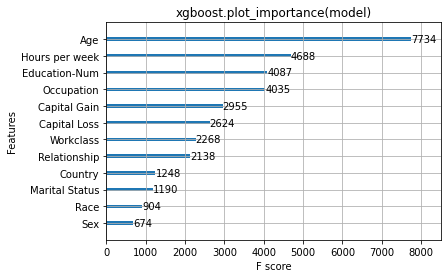

In [ ]:
xgboost.plot_importance(model)
pl.title("xgboost.plot_importance(model)")
pl.show()

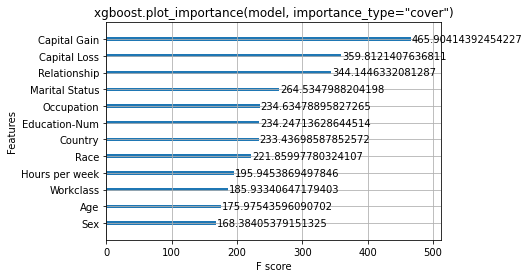

In [ ]:
xgboost.plot_importance(model, importance_type="cover")
pl.title('xgboost.plot_importance(model, importance_type="cover")')
pl.show()

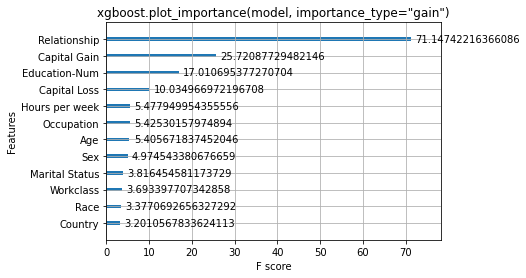

In [ ]:
xgboost.plot_importance(model, importance_type="gain")
pl.title('xgboost.plot_importance(model, importance_type="gain")')
pl.show()

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_display.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_display.iloc[:1000,:])

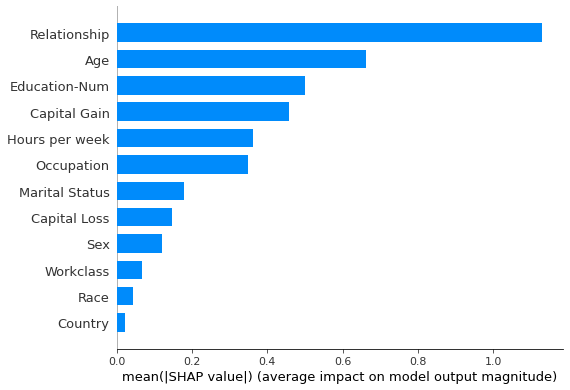

In [ ]:
shap.summary_plot(shap_values, X_display, plot_type="bar")

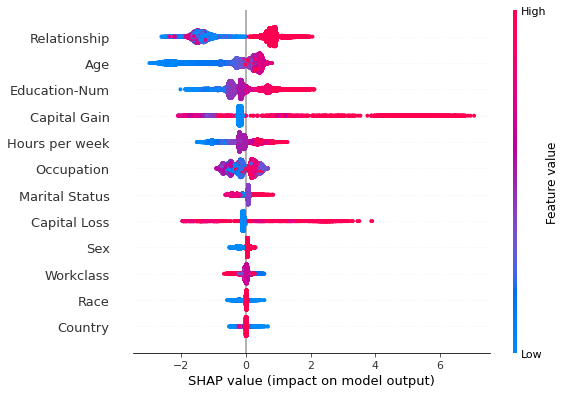

In [ ]:
shap.summary_plot(shap_values, X)

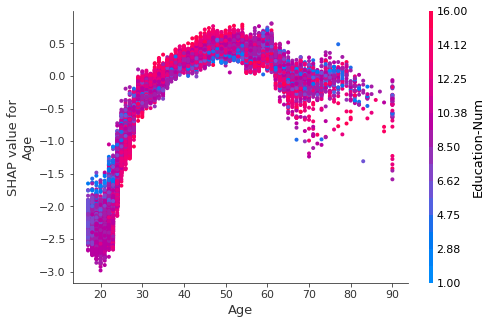

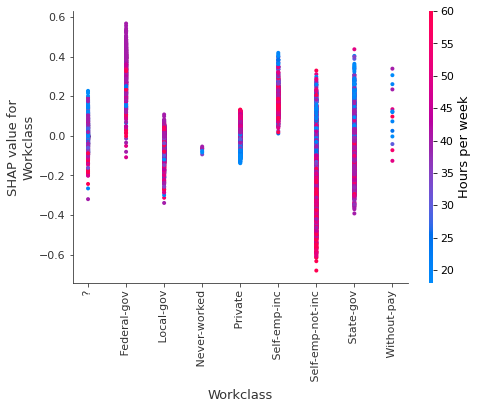

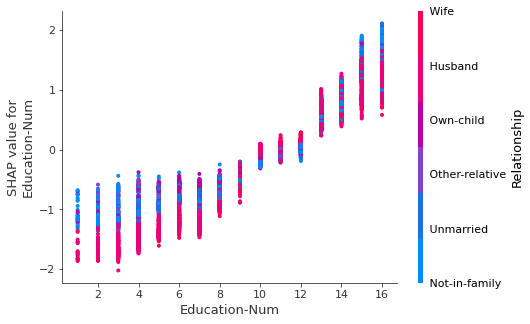

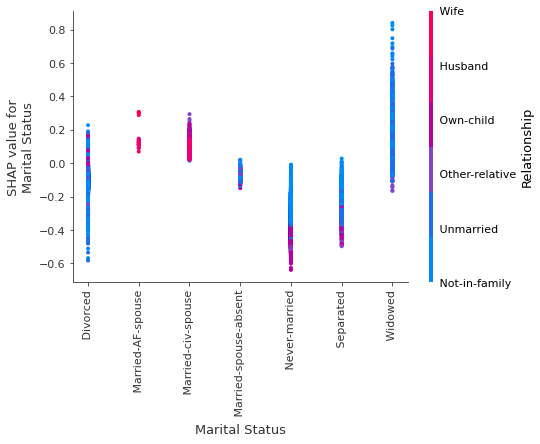

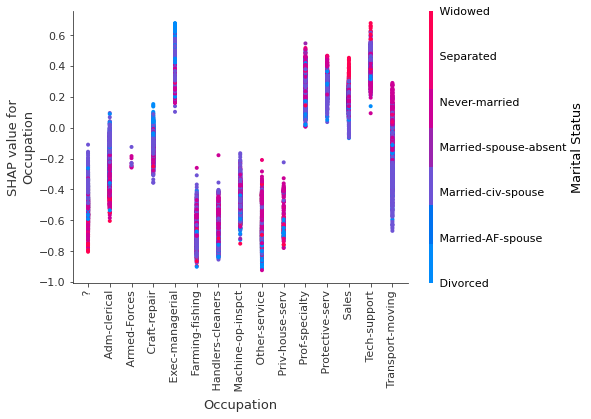

...

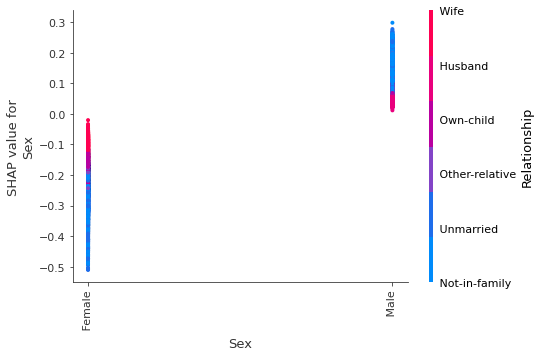

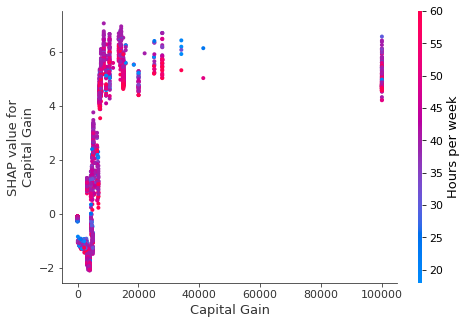

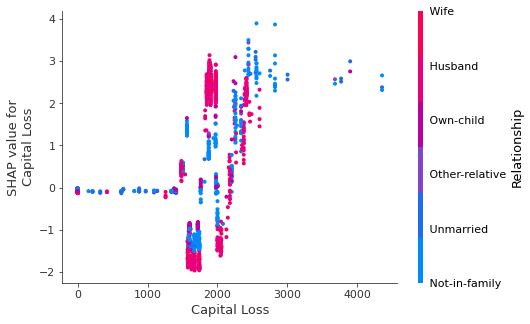

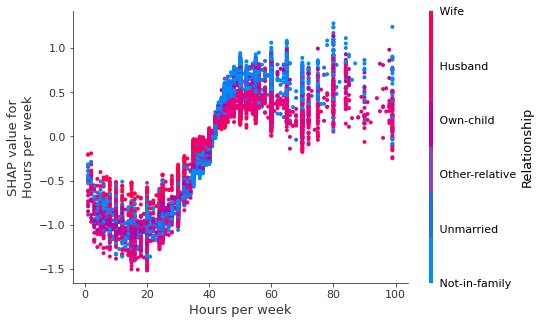

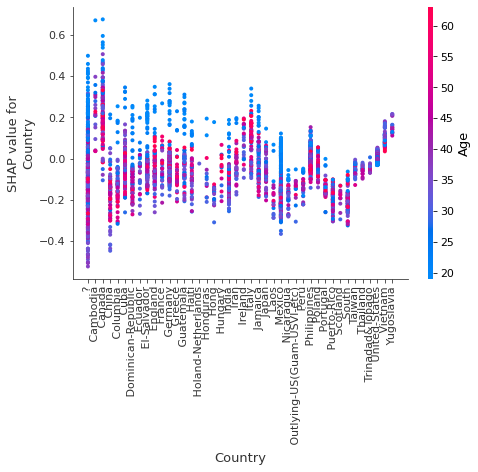

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X, display_features=X_display)

## Simple supervised clustering

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

shap_pca50 = PCA(n_components=12).fit_transform(shap_values[:1000,:])
shap_embedded = TSNE(n_components=2, perplexity=50).fit_transform(shap_values[:1000,:])

In [ ]:
import matplotlib
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MaxNLocator
cdict1 = {
    'red': ((0.0, 0.11764705882352941, 0.11764705882352941),
            (1.0, 0.9607843137254902, 0.9607843137254902)),

    'green': ((0.0, 0.5333333333333333, 0.5333333333333333),
              (1.0, 0.15294117647058825, 0.15294117647058825)),

    'blue': ((0.0, 0.8980392156862745, 0.8980392156862745),
             (1.0, 0.3411764705882353, 0.3411764705882353)),

    'alpha': ((0.0, 1, 1),
              (0.5, 1, 1),
              (1.0, 1, 1))
}  # #1E88E5 -> #ff0052
red_blue_solid = LinearSegmentedColormap('RedBlue', cdict1)

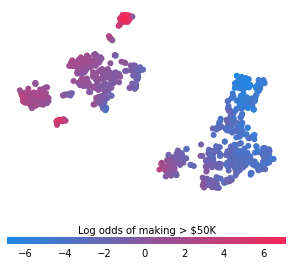

In [ ]:
f = pl.figure(figsize=(5,5))
pl.scatter(shap_embedded[:,0],
           shap_embedded[:,1],
           c=shap_values[:1000,:].sum(1).astype(np.float64),
           linewidth=0, alpha=1., cmap=red_blue_solid)
cb = pl.colorbar(label="Log odds of making > $50K", aspect=40, orientation="horizontal")
cb.set_alpha(1)
cb.draw_all()
cb.outline.set_linewidth(0)
cb.ax.tick_params('x', length=0)
cb.ax.xaxis.set_label_position('top')
pl.gca().axis("off")
pl.show()

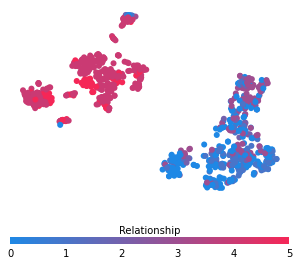

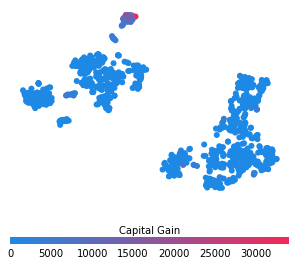

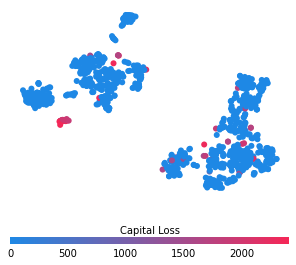

In [ ]:
for feature in ["Relationship", "Capital Gain", "Capital Loss"]:
    f = pl.figure(figsize=(5,5))
    pl.scatter(shap_embedded[:,0],
               shap_embedded[:,1],
               c=X[feature].values[:1000].astype(np.float64),
               linewidth=0, alpha=1., cmap=red_blue_solid)
    cb = pl.colorbar(label=feature, aspect=40, orientation="horizontal")
    cb.set_alpha(1)
    cb.draw_all()
    cb.outline.set_linewidth(0)
    cb.ax.tick_params('x', length=0)
    cb.ax.xaxis.set_label_position('top')
    pl.gca().axis("off")
    pl.show()

In [ ]:
params = {
    "eta": 0.05,
    "max_depth": 1,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train),
    "eval_metric": "logloss"
}
model_ind = xgboost.train(params, d_train, 5000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.541124
Will train until test-logloss hasn't improved in 20 rounds.
[100]	test-logloss:0.354994
[200]	test-logloss:0.328477
[300]	test-logloss:0.319012
[400]	test-logloss:0.313311
[500]	test-logloss:0.309297
[600]	test-logloss:0.306193
[700]	test-logloss:0.303711
[800]	test-logloss:0.301841
[900]	test-logloss:0.300346
[1000]	test-logloss:0.299129
[1100]	test-logloss:0.297959
[1200]	test-logloss:0.296945
[1300]	test-logloss:0.296062
[1400]	test-logloss:0.295253
[1500]	test-logloss:0.294713
Stopping. Best iteration:
[1546]	test-logloss:0.294321



In [ ]:
shap_values_ind = shap.TreeExplainer(model_ind).shap_values(X)

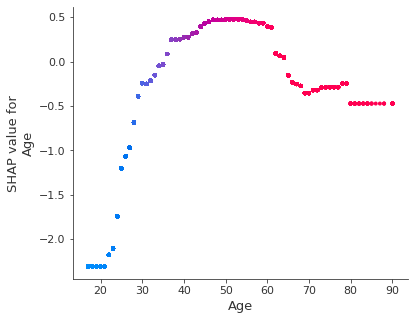

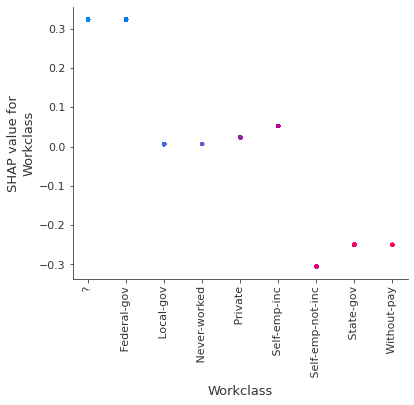

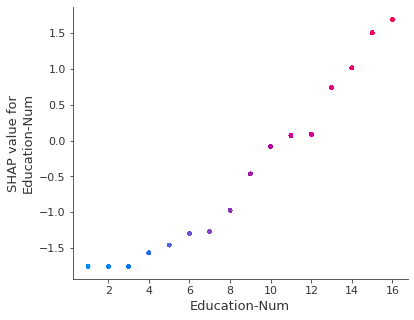

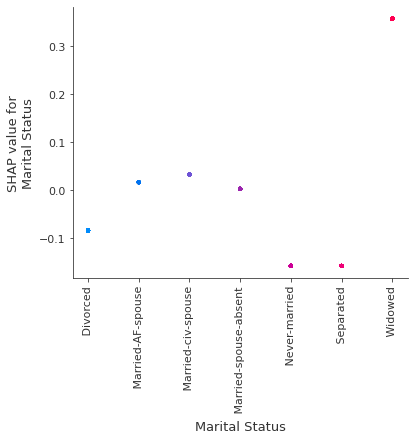

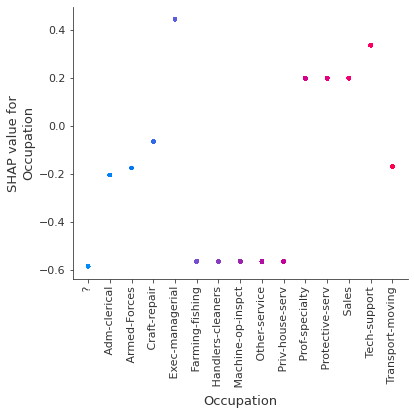

...

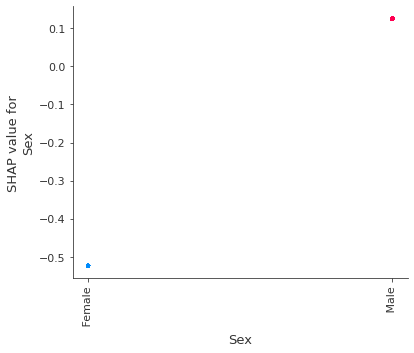

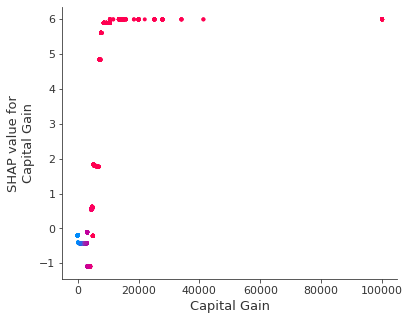

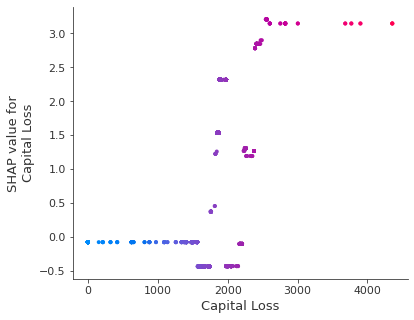

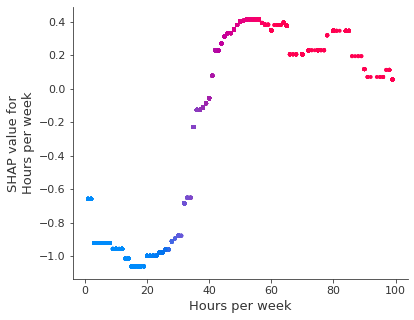

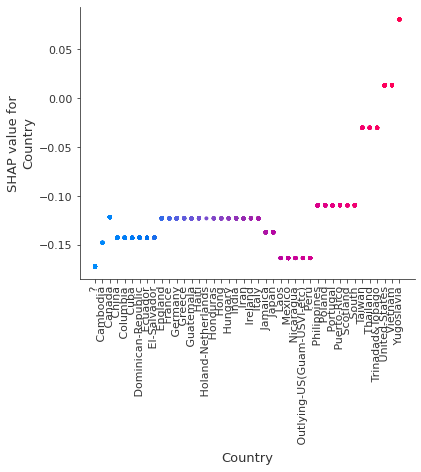

In [ ]:
np.seterr(divide='ignore', invalid='ignore')
for name in X_train.columns:
    shap.dependence_plot(name, shap_values_ind, X, display_features=X_display)

# Part 2a (All Features)

In [ ]:
train_url = "https://raw.githubusercontent.com/gloriankosi/cs-301-project/main/house-prices-advanced-regression-techniques/train.csv"
test_url = "https://raw.githubusercontent.com/gloriankosi/cs-301-project/main/house-prices-advanced-regression-techniques/test.csv"

import numpy as np
import pandas as pd
import xgboost
from xgboost import XGBRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from matplotlib.pyplot import figure
from matplotlib import pyplot
import matplotlib
import math
import shap

train = pd.read_csv(train_url)

train.dropna(axis=0, subset=['SalePrice'], inplace=True)
train.drop("Id", axis = 1, inplace = True)

y = train.SalePrice
X = train.drop(['SalePrice'], axis=1).select_dtypes(exclude=['object'])

train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.25)

model = XGBRegressor(learning_rate=0.1 , objective ='reg:squarederror' , n_estimators=100)
model.fit(train_X , train_y)

predictions1 = model.predict(test_X)

test_X = test_X.assign(Target = test_y.values)
test_X = test_X.assign(Prediction = predictions1)

print(test_X)


      MSSubClass  LotFrontage  LotArea  ...  YrSold  Target     Prediction
406           50         51.0    10480  ...    2008  115000  128289.648438
995           50         51.0     4712  ...    2006  121600  114887.187500
737           60         72.0    10463  ...    2006  239900  244211.390625
695           20         54.0    13811  ...    2006  176000  164563.093750
2             60         68.0    11250  ...    2008  223500  202498.718750
...          ...          ...      ...  ...     ...     ...            ...
761           30         60.0     6911  ...    2009  100000  121748.609375
1015          60         70.0     8400  ...    2009  227000  230216.765625
1155          20         90.0    10768  ...    2007  218000  186173.078125
698           20         65.0     8450  ...    2010  138500  141822.765625
436           50         40.0     4400  ...    2006  116000  112459.148438

[365 rows x 38 columns]


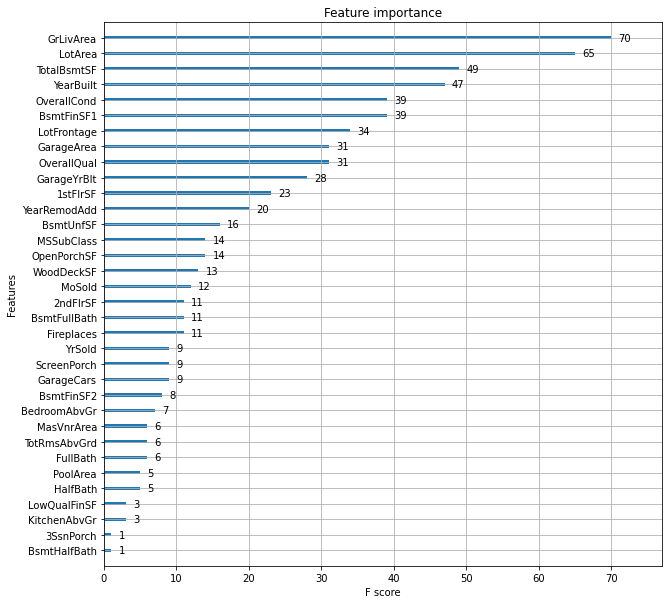

In [ ]:
ax = xgboost.plot_importance(model)
fig = ax.figure
fig.set_size_inches(10, 10)
fig.show()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_X)

# https://github.com/slundberg/shap/issues/632
z = train_X.columns[np.argsort(np.abs(shap_values).mean(0))]
middle = len(z)//2
z1 = z[middle:]

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], train_X.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:1000,:], train_X.iloc[:1000,:])

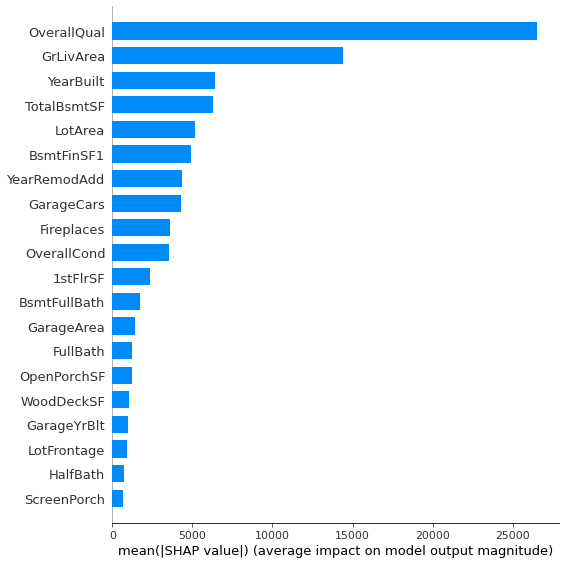

In [ ]:
shap.summary_plot(shap_values, train_X, plot_type="bar")

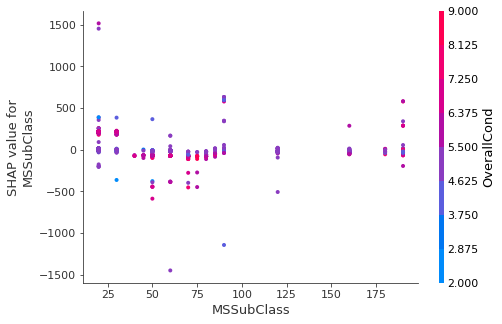

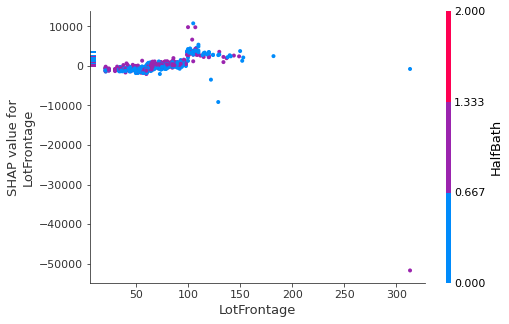

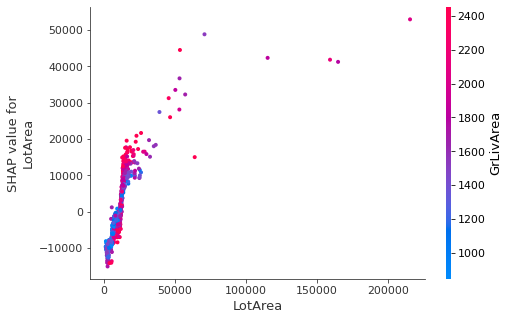

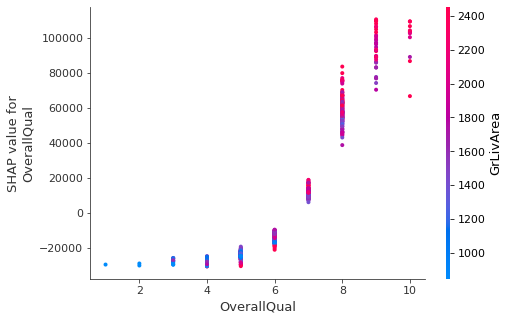

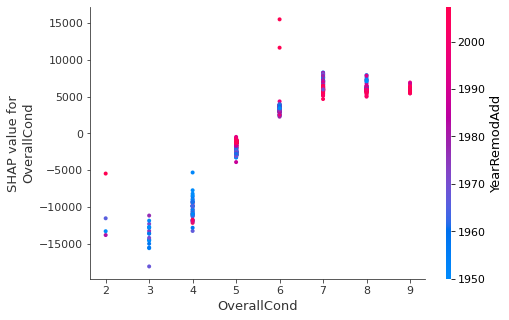

...

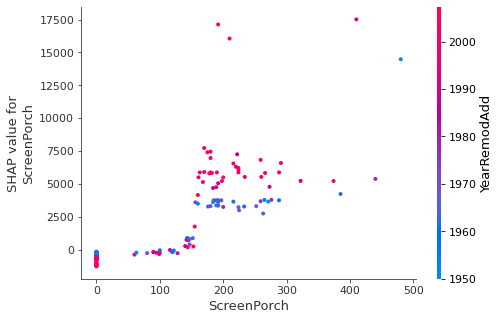

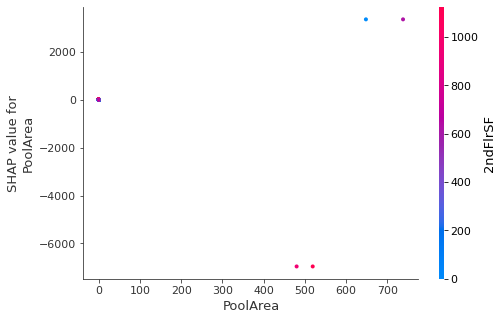

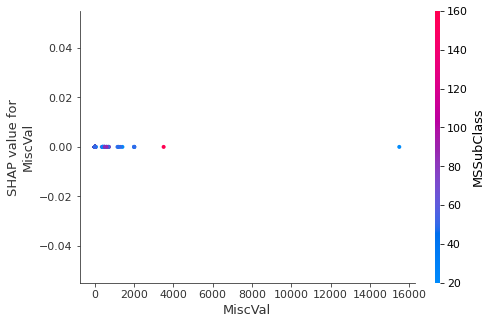

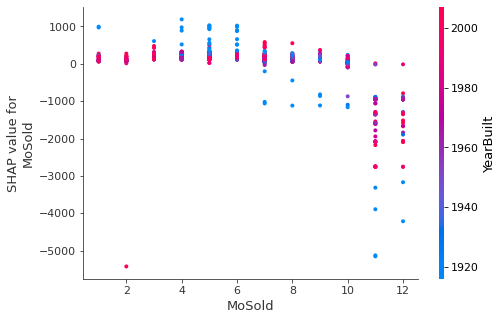

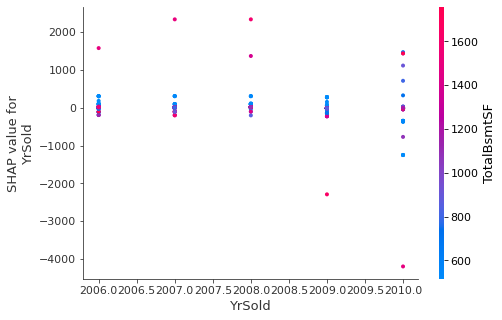

In [ ]:
for name in train_X.columns:
    shap.dependence_plot(name, shap_values, train_X, display_features=train_X)

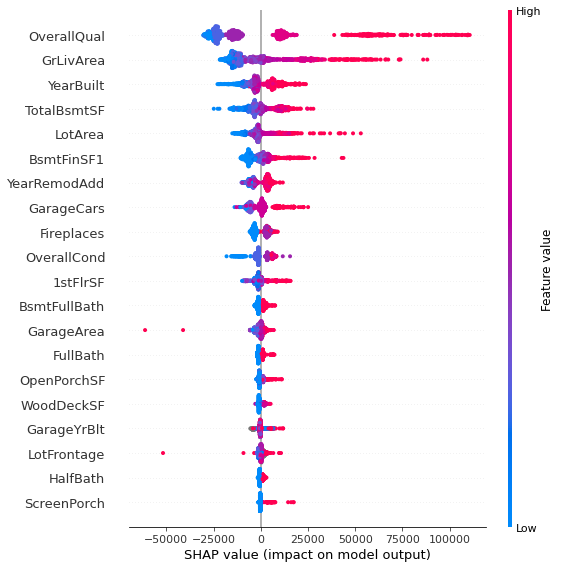

In [ ]:
shap.summary_plot(shap_values, train_X)

## Part 2b (18 Features)

In [ ]:
not_min_features = [column for column in train_X.columns
                    if column not in z1]

y = train.SalePrice
not_min_features.append('SalePrice')
X = train.drop(not_min_features, axis=1).select_dtypes(exclude=['object'])

mf_train_X, mf_test_X, train_y, test_y = train_test_split(X, y, test_size=0.25)

model.fit(mf_train_X , train_y)

predictions2 = model.predict(mf_test_X)

mf_test_X = mf_test_X.assign(Target = test_y.values)
mf_test_X = mf_test_X.assign(Prediction = predictions2)

print(mf_test_X)

      LotFrontage  LotArea  OverallQual  ...  OpenPorchSF  Target     Prediction
49           66.0     7742            5  ...            0  127000  132627.234375
1230          NaN    18890            5  ...           24  190000  202108.859375
808          85.0    13400            5  ...            0  159950  144016.515625
1121         84.0    10084            7  ...           20  212900  212940.875000
877          74.0     8834            9  ...            0  350000  330622.031250
...           ...      ...          ...  ...          ...     ...            ...
110          75.0     9525            6  ...            0  136900  139533.859375
947          85.0    14536            8  ...          252  270000  324615.093750
441          92.0    12108            4  ...            0  118000  126579.335938
1327         60.0     6600            5  ...            0  130500  128509.742188
811           NaN     4438            6  ...            0  144500  146233.375000

[365 rows x 20 columns]


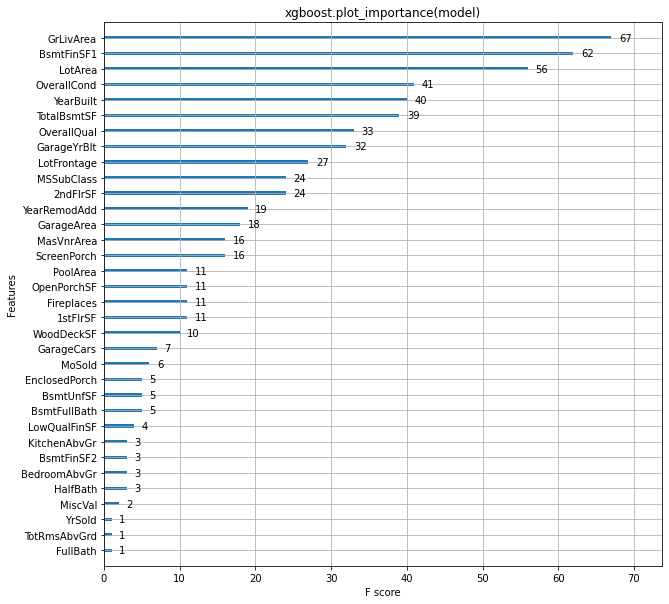

In [ ]:
ax = xgboost.plot_importance(model)
fig = ax.figure
fig.set_size_inches(10, 10)
pl.title("xgboost.plot_importance(model)")
pl.show()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(mf_train_X)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], mf_train_X.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[:1000,:], mf_train_X.iloc[:1000,:])

## Part 2C (9 features)

In [ ]:
middle_index = math.floor(len(z1)/2)
z2 = z1[middle_index:]

not_min_features_1 = [column for column in train_X.columns
                    if column not in z2]

not_min_features_1.append('SalePrice')

X = train.drop(not_min_features_1, axis=1).select_dtypes(exclude=['object'])
print(X.columns)

mf_train_X, mf_test_X, train_y, test_y = train_test_split(X, y, test_size=0.25)

model.fit(mf_train_X , train_y)

predictions2 = model.predict(mf_test_X)

mf_test_X = mf_test_X.assign(Target = test_y.values)
mf_test_X = mf_test_X.assign(Prediction = predictions2)

print(mf_test_X)

Index(['LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1',
       'TotalBsmtSF', 'GrLivArea', 'Fireplaces', 'GarageCars'],
      dtype='object')
      LotArea  OverallQual  YearBuilt  ...  GarageCars  Target     Prediction
1348    16196            7       1998  ...           2  215000  251096.984375
185     22950           10       1892  ...           3  475000  440025.625000
41      16905            5       1959  ...           1  170000  157504.375000
563     21780            6       1918  ...           2  185000  171701.906250
530     10200            6       1988  ...           2  175000  188409.671875
...       ...          ...        ...  ...         ...     ...            ...
883      6204            4       1912  ...           1  118500   99505.789062
1442    11003           10       2008  ...           3  310000  318463.625000
834      7875            5       1961  ...           2  139950  138311.343750
1240     8158            7       2003  ...           2  22

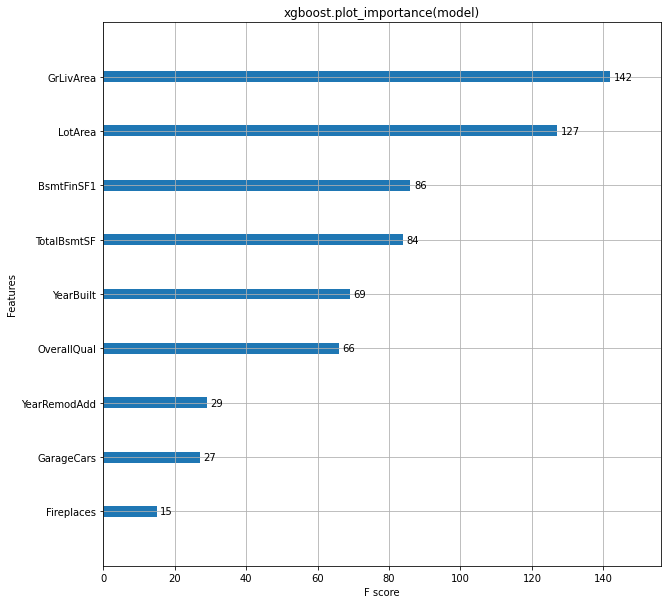

In [ ]:
ax = xgboost.plot_importance(model)
fig = ax.figure
fig.set_size_inches(10, 10)
pl.title("xgboost.plot_importance(model)")
pl.show()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(mf_train_X)

In [57]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], mf_train_X.iloc[0,:])

## Part 2D (5 features)

In [ ]:
middle_index = math.floor(len(z2)/2)
z3 = z2[middle_index:]
not_min_features_2 = [column for column in train_X.columns
                    if column not in z3]

not_min_features_2.append("SalePrice")

X = train.drop(not_min_features_2, axis=1).select_dtypes(exclude=['object'])
mf_train_X, mf_test_X, train_y, test_y = train_test_split(X, y, test_size=0.25)

model.fit(mf_train_X , train_y)

predictions3 = model.predict(mf_test_X)

mf_test_X = mf_test_X.assign(Target = test_y.values)
mf_test_X = mf_test_X.assign(Prediction = predictions3)


print(mf_test_X)

      LotArea  OverallQual  YearBuilt  ...  GrLivArea  Target     Prediction
963     11923            9       2007  ...       1800  239000  340466.093750
683     11248            9       2002  ...       1668  285000  316673.125000
15       6120            7       1929  ...        854  132000  142942.140625
358      6930            5       1958  ...       1352  130000  138961.343750
1159     9120            6       1974  ...       1876  185000  177282.093750
...       ...          ...        ...  ...        ...     ...            ...
1164    16157            5       1978  ...       1432  194000  180058.062500
229      3182            7       2005  ...       1555  192500  196887.437500
1367     2665            5       1977  ...       1475  127000  129600.976562
1006    12155            6       1970  ...       1657  163500  176629.671875
1315    11075            6       1969  ...       2112  206900  189875.531250

[365 rows x 7 columns]


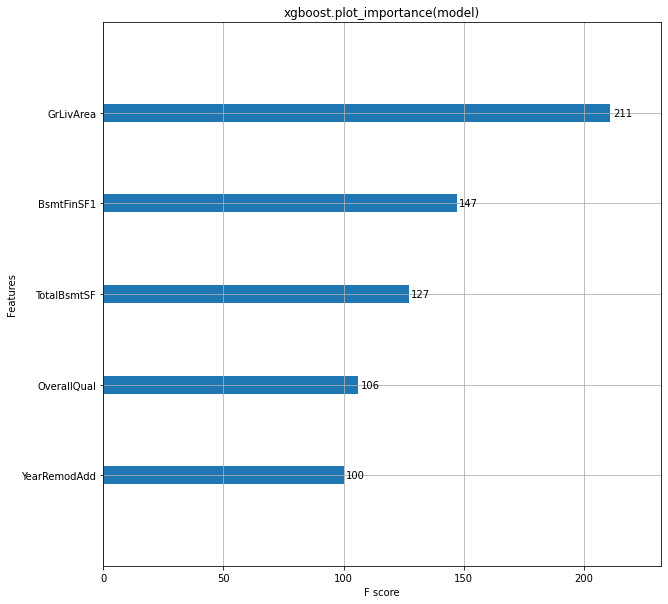

In [ ]:
ax = xgboost.plot_importance(model)
fig = ax.figure
fig.set_size_inches(10, 10)
pl.title("xgboost.plot_importance(model)")
pl.show()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(mf_train_X)

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], mf_train_X.iloc[0,:])